In [2]:
import torch
from diffusers import StableDiffusionPipeline

!pip -q install --upgrade diffusers transformers accelerate safetensors
!pip -q install --upgrade xformers

pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipe.to("cuda")

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 93.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 55.9 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

StableDiffusionSafetyChecker LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/safety_checker
Key                                               | Status     |  | 
--------------------------------------------------+------------+--+-
vision_model.vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.36.0",
  "_name_or_path": "runwayml/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [3]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt

print("GPU available:", torch.cuda.is_available())
print("GPU:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "None")

GPU available: True
GPU: Tesla T4


In [4]:
model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16,
    safety_checker=None  # keep for academic demo; remove if your institute requires safety checker
)

pipe = pipe.to("cuda")

# Optional speed boost (works best on some GPUs)
pipe.enable_attention_slicing()

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its resul

In [5]:
import os, time
from PIL import Image

os.makedirs("outputs", exist_ok=True)

def generate_image(
    prompt,
    negative_prompt="",
    steps=30,
    guidance=7.5,
    seed=42,
    height=512,
    width=512,
    save_name=None
):
    generator = torch.Generator("cuda").manual_seed(seed)

    t0 = time.time()
    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt if negative_prompt else None,
        num_inference_steps=steps,
        guidance_scale=guidance,
        generator=generator,
        height=height,
        width=width
    ).images[0]
    t1 = time.time()

    # Display
    plt.figure(figsize=(6,6))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Prompt: {prompt}\nseed={seed}, steps={steps}, guidance={guidance} (time={t1-t0:.1f}s)")
    plt.show()

    # Save
    if save_name is None:
        save_name = f"img_seed{seed}_steps{steps}_g{guidance}.png"
    path = os.path.join("outputs", save_name)
    image.save(path)
    print("Saved:", path)
    return image

In [6]:
import os, time
from PIL import Image

os.makedirs("outputs", exist_ok=True)

def generate_image(
    prompt,
    negative_prompt="",
    steps=30,
    guidance=7.5,
    seed=42,
    height=512,
    width=512,
    save_name=None
):
    generator = torch.Generator("cuda").manual_seed(seed)

    t0 = time.time()
    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt if negative_prompt else None,
        num_inference_steps=steps,
        guidance_scale=guidance,
        generator=generator,
        height=height,
        width=width
    ).images[0]
    t1 = time.time()

    # Display
    plt.figure(figsize=(6,6))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Prompt: {prompt}\nseed={seed}, steps={steps}, guidance={guidance} (time={t1-t0:.1f}s)")
    plt.show()

    # Save
    if save_name is None:
        save_name = f"img_seed{seed}_steps{steps}_g{guidance}.png"
    path = os.path.join("outputs", save_name)
    image.save(path)
    print("Saved:", path)
    return image

  0%|          | 0/35 [00:00<?, ?it/s]

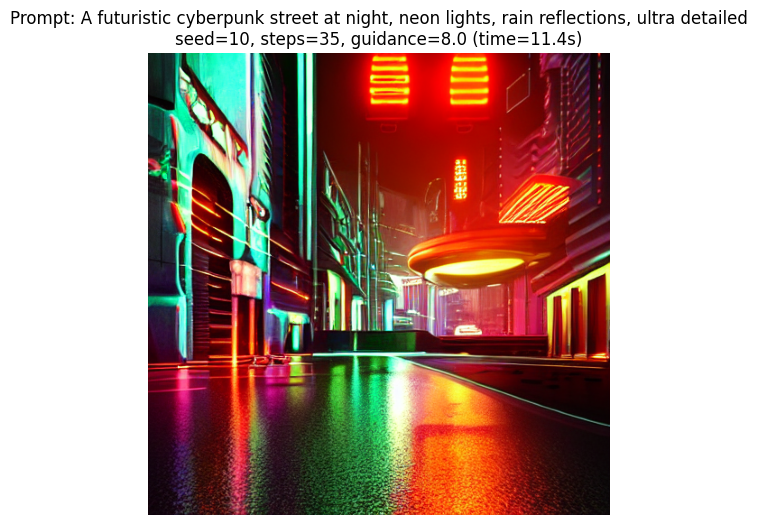

Saved: outputs/cyberpunk.png


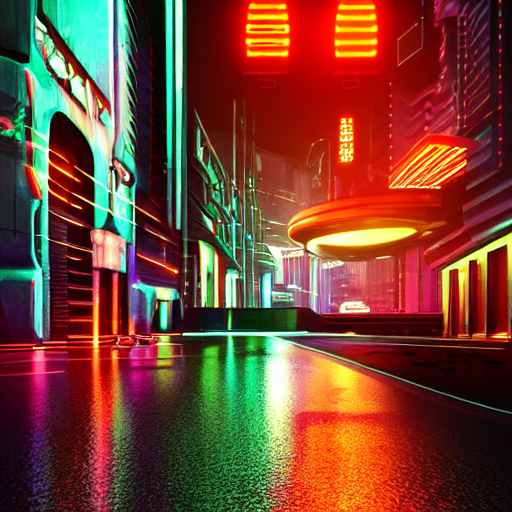

In [7]:
prompt = "A futuristic cyberpunk street at night, neon lights, rain reflections, ultra detailed"
generate_image(prompt, steps=35, guidance=8.0, seed=10, save_name="cyberpunk.png")

A) Prompt engineering (same seed, different wording)

This shows how text encoding changes the image even with the same seed.

  0%|          | 0/30 [00:00<?, ?it/s]

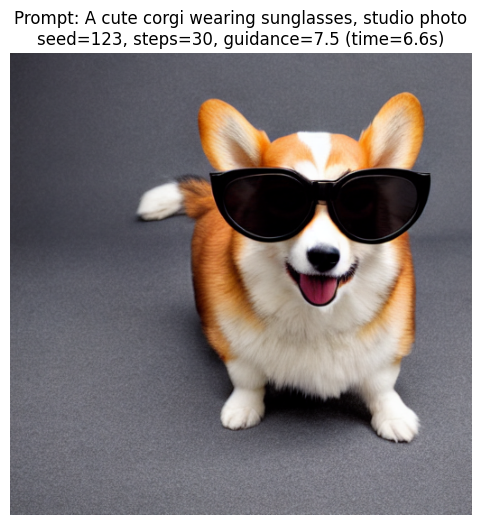

Saved: outputs/prompt_variation_1.png


  0%|          | 0/30 [00:00<?, ?it/s]

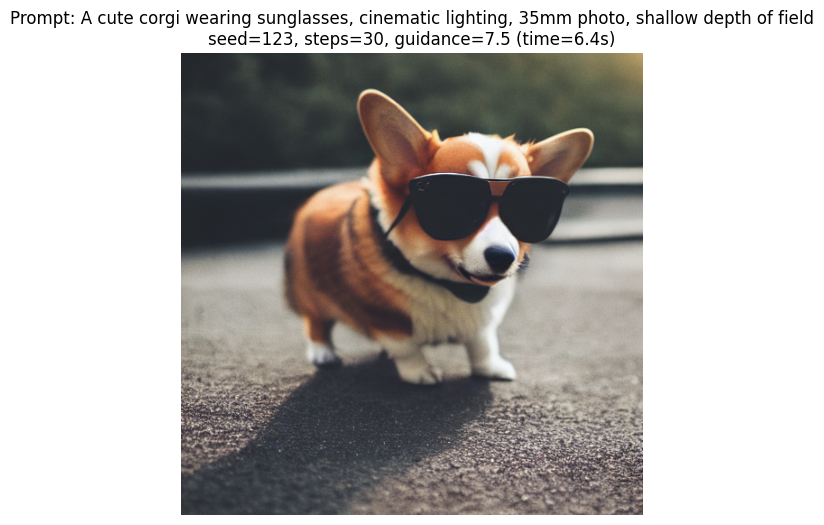

Saved: outputs/prompt_variation_2.png


  0%|          | 0/30 [00:00<?, ?it/s]

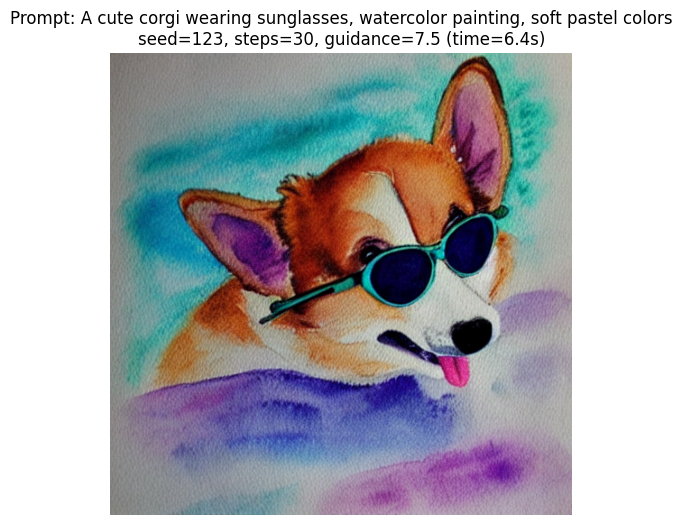

Saved: outputs/prompt_variation_3.png


In [8]:
base_seed = 123

prompts = [
    "A cute corgi wearing sunglasses, studio photo",
    "A cute corgi wearing sunglasses, cinematic lighting, 35mm photo, shallow depth of field",
    "A cute corgi wearing sunglasses, watercolor painting, soft pastel colors"
]

for i, p in enumerate(prompts, 1):
    generate_image(p, steps=30, guidance=7.5, seed=base_seed, save_name=f"prompt_variation_{i}.png")

B) Negative prompts (reduce unwanted artifacts)

  0%|          | 0/35 [00:00<?, ?it/s]

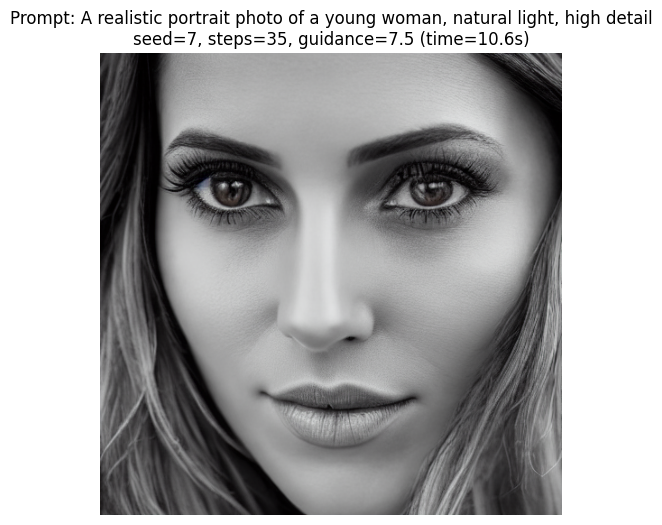

Saved: outputs/portrait_with_negative.png


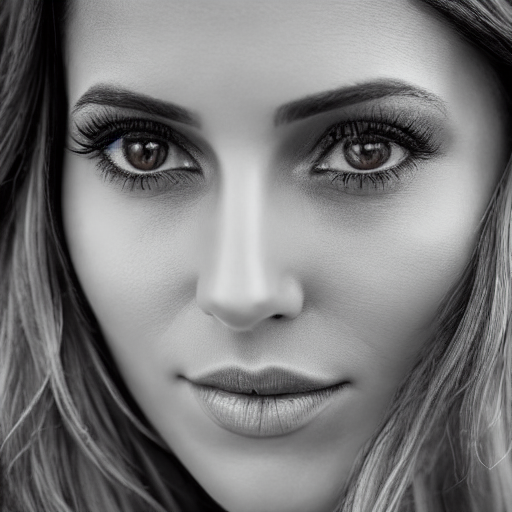

In [9]:
prompt = "A realistic portrait photo of a young woman, natural light, high detail"
neg = "blurry, low quality, deformed, extra fingers, extra limbs, bad anatomy, distorted face"

generate_image(prompt, negative_prompt=neg, steps=35, guidance=7.5, seed=7, save_name="portrait_with_negative.png")

C) Guidance scale sweep (how strongly the model follows the prompt)

  0%|          | 0/30 [00:00<?, ?it/s]

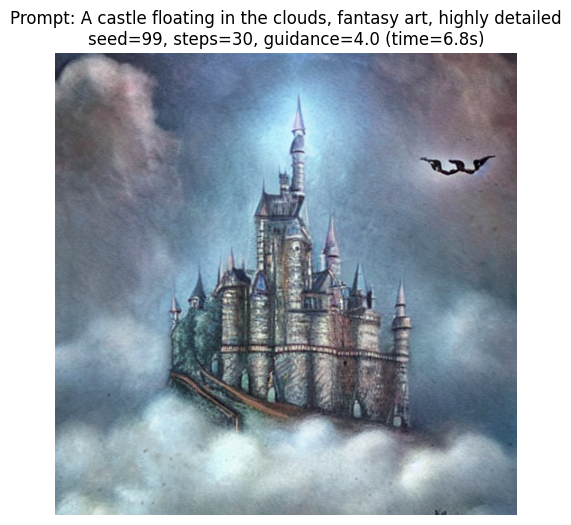

Saved: outputs/guidance_4.0.png


  0%|          | 0/30 [00:00<?, ?it/s]

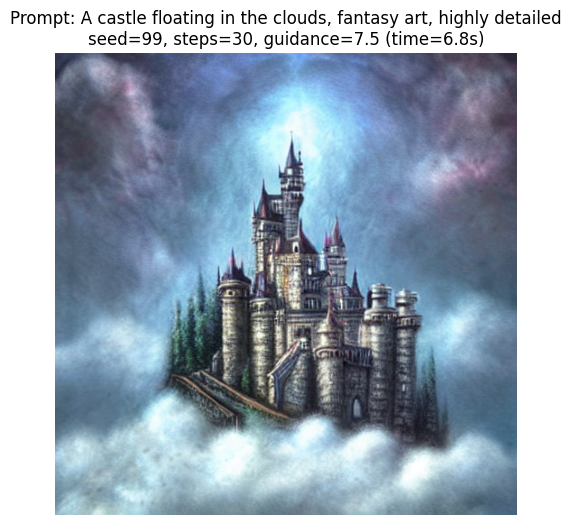

Saved: outputs/guidance_7.5.png


  0%|          | 0/30 [00:00<?, ?it/s]

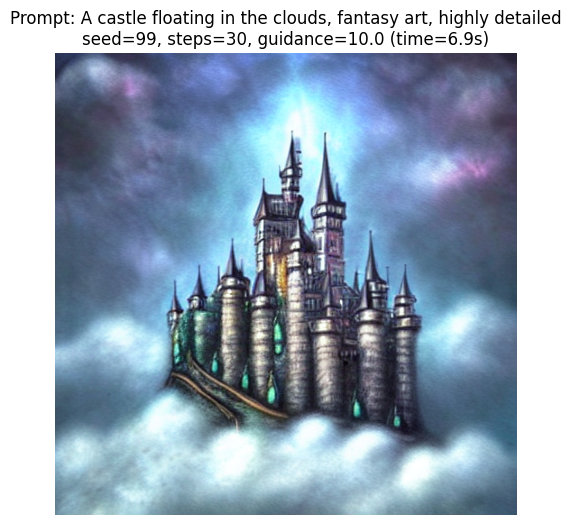

Saved: outputs/guidance_10.0.png


  0%|          | 0/30 [00:00<?, ?it/s]

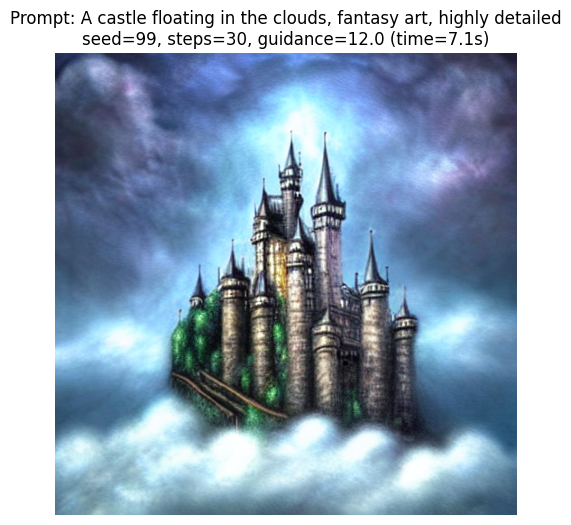

Saved: outputs/guidance_12.0.png


In [10]:
prompt = "A castle floating in the clouds, fantasy art, highly detailed"
seed = 99

for g in [4.0, 7.5, 10.0, 12.0]:
    generate_image(prompt, steps=30, guidance=g, seed=seed, save_name=f"guidance_{g}.png")

D) Seed sweep (diversity with same prompt)

  0%|          | 0/30 [00:00<?, ?it/s]

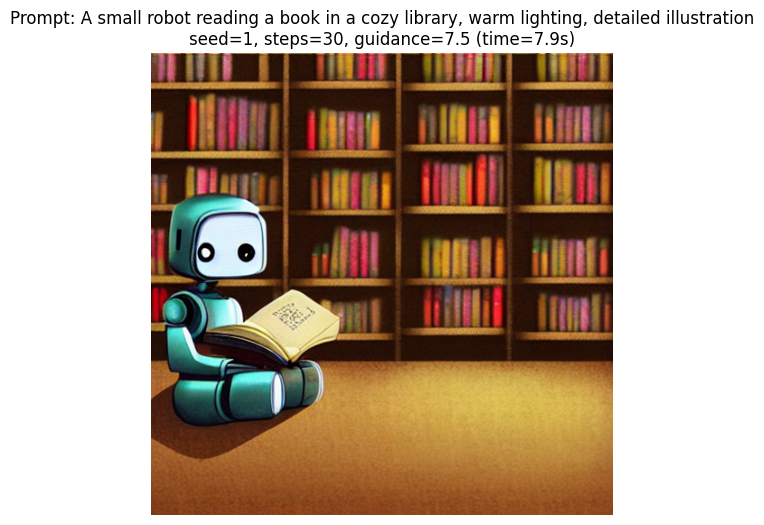

Saved: outputs/seed_1.png


  0%|          | 0/30 [00:00<?, ?it/s]

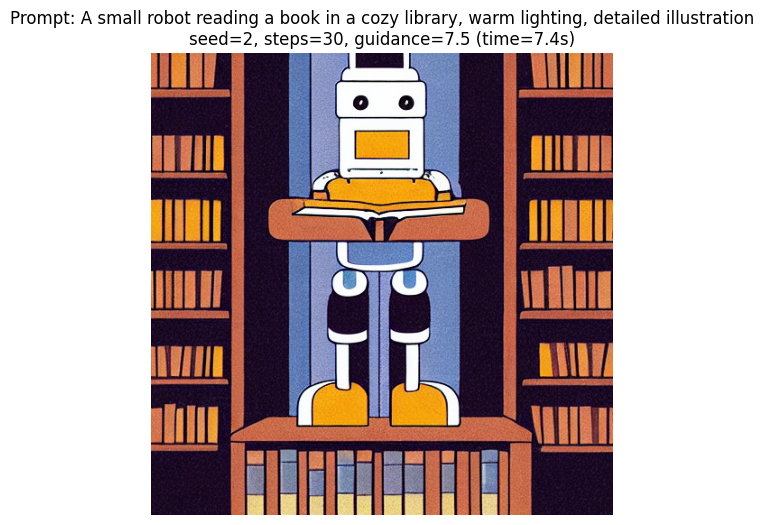

Saved: outputs/seed_2.png


  0%|          | 0/30 [00:00<?, ?it/s]

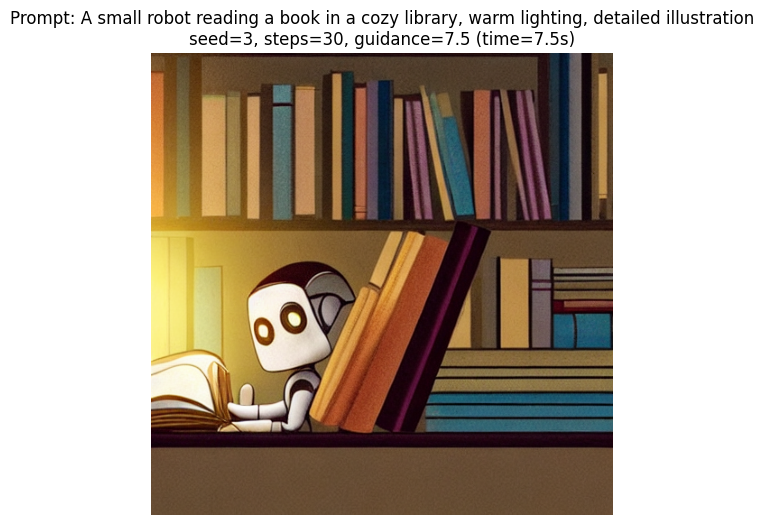

Saved: outputs/seed_3.png


  0%|          | 0/30 [00:00<?, ?it/s]

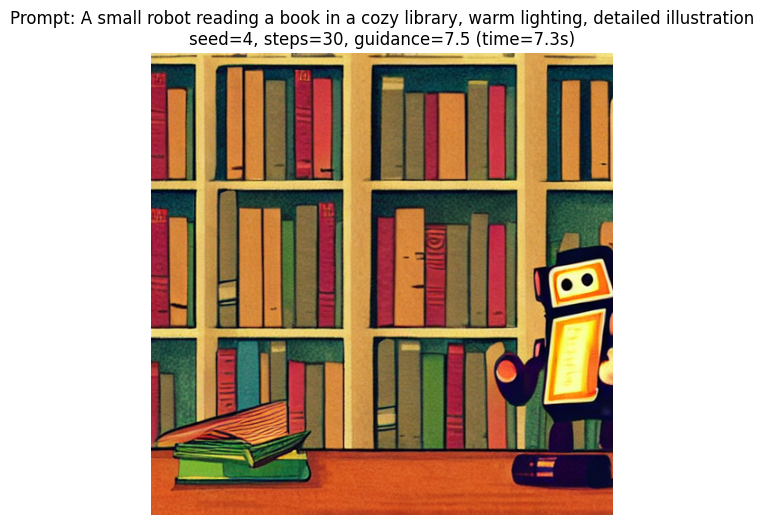

Saved: outputs/seed_4.png


In [11]:
prompt = "A small robot reading a book in a cozy library, warm lighting, detailed illustration"

for s in [1, 2, 3, 4]:
    generate_image(prompt, steps=30, guidance=7.5, seed=s, save_name=f"seed_{s}.png")

E) Batch generation (multiple images quickly)

  0%|          | 0/28 [00:00<?, ?it/s]

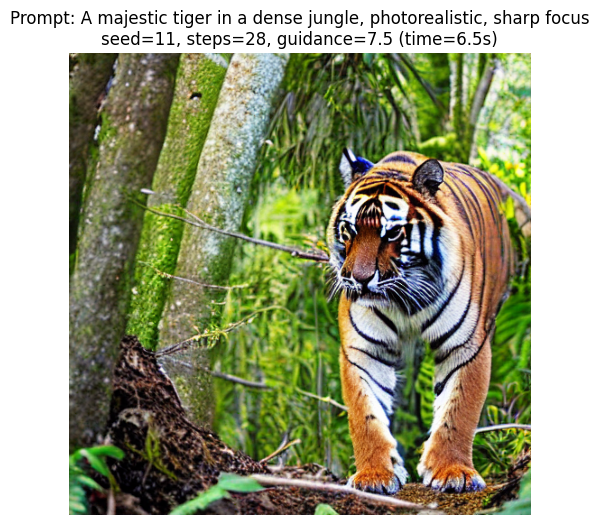

Saved: outputs/tiger_11.png


  0%|          | 0/28 [00:00<?, ?it/s]

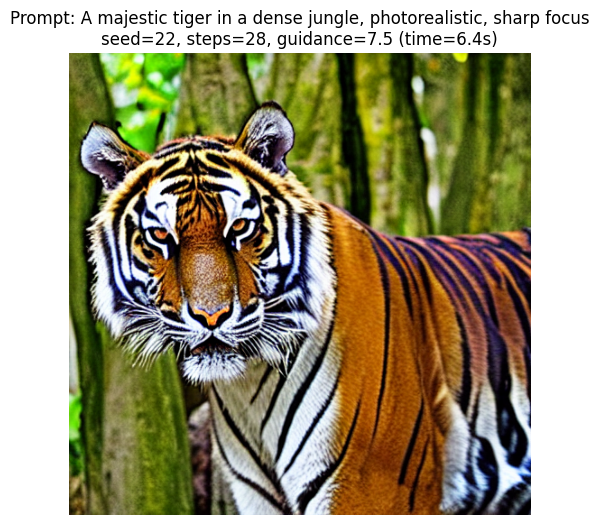

Saved: outputs/tiger_22.png


  0%|          | 0/28 [00:00<?, ?it/s]

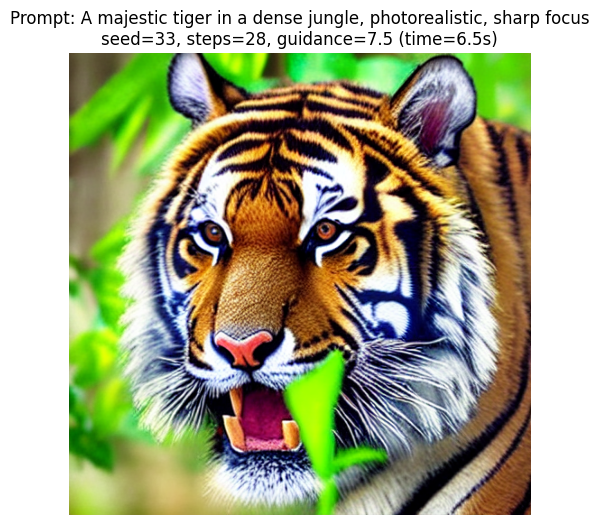

Saved: outputs/tiger_33.png


  0%|          | 0/28 [00:00<?, ?it/s]

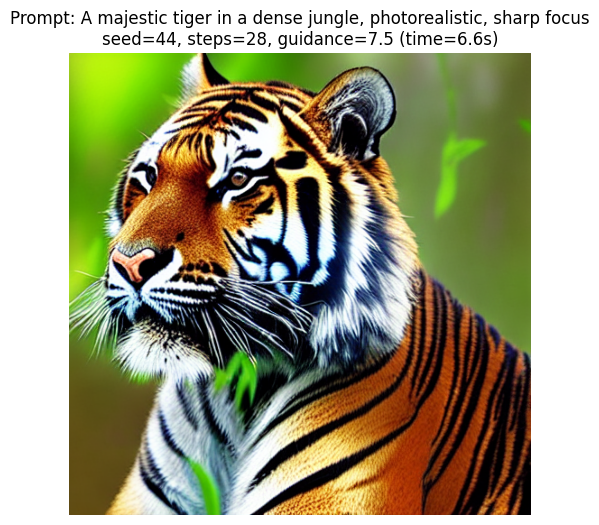

Saved: outputs/tiger_44.png


In [12]:
prompt = "A majestic tiger in a dense jungle, photorealistic, sharp focus"
neg = "blurry, low quality, deformed"
seeds = [11, 22, 33, 44]

images = []
for s in seeds:
    images.append(generate_image(prompt, negative_prompt=neg, steps=28, guidance=7.5, seed=s, save_name=f"tiger_{s}.png"))

In [13]:
!zip -r outputs.zip outputs

  adding: outputs/ (stored 0%)
  adding: outputs/tiger_11.png (deflated 0%)
  adding: outputs/prompt_variation_2.png (deflated 0%)
  adding: outputs/guidance_7.5.png (deflated 0%)
  adding: outputs/prompt_variation_3.png (deflated 0%)
  adding: outputs/seed_3.png (deflated 0%)
  adding: outputs/tiger_33.png (deflated 0%)
  adding: outputs/guidance_12.0.png (deflated 0%)
  adding: outputs/guidance_4.0.png (deflated 0%)
  adding: outputs/cyberpunk.png (deflated 0%)
  adding: outputs/prompt_variation_1.png (deflated 0%)
  adding: outputs/seed_2.png (deflated 0%)
  adding: outputs/tiger_44.png (deflated 0%)
  adding: outputs/tiger_22.png (deflated 0%)
  adding: outputs/portrait_with_negative.png (deflated 0%)
  adding: outputs/guidance_10.0.png (deflated 0%)
  adding: outputs/seed_4.png (deflated 0%)
  adding: outputs/seed_1.png (deflated 0%)
